In [1]:
# IMPORTANT - *** fields are placeholders for your code. If you are not sure what they should contain, check the full solution.

In [2]:
# First make sure to install all required packages.
# You can do it by running the following command:

In [3]:
# ]add Arrow CSV DataFrames Plots FreqTables StatsBase Chain

In [4]:
# If you launched Jupyter in directory with attached Project.toml and Manifest.toml
# use below command to install required packages with fixed versions. 
# Check Project introduction for more information.

In [5]:
# ] instantiate

In [6]:
# Import required libraries
import Downloads
import SHA
using Arrow
using Chain
using CSV
using DataFrames
using Plots
using FreqTables
using Statistics
using StatsBase

# Adult

In [7]:
# Define URL to Adult data and expected SHA1
const ADULT_TRAIN = "https://archive.ics.uci.edu/ml/" *
                    "machine-learning-databases/adult/adult.data"
const ADULT_TRAIN_NAME = "adult_train.txt"

const ADULT_TRAIN_SHA1 = [0xee, 0x86, 0xbb, 0xe5, 0x56,
                          0x57, 0x8f, 0x70, 0x9a, 0xe0,
                          0xfd, 0x00, 0x2a, 0xc5, 0x8a,
                          0xc9, 0x37, 0x26, 0x48, 0x2f];

In [8]:
# Download Adult data if not exists
if isfile(ADULT_TRAIN_NAME)
    @info "$ADULT_TRAIN_NAME found. Skipping download."
else
    @info "$ADULT_TRAIN_NAME not found. Fetching from source."
    Downloads.download(ADULT_TRAIN, ADULT_TRAIN_NAME)
end

┌ Info: adult_train.txt found. Skipping download.
└ @ Main In[8]:3


In [9]:
# Check SHA1 of Adult file
if ADULT_TRAIN_SHA1 == open(SHA.sha1, ADULT_TRAIN_NAME)
    @info "SHA1 check of $ADULT_TRAIN_NAME passed."
else
    error("$ADULT_TRAIN_NAME file has an invalid SHA1. Aborting!")
end

┌ Info: SHA1 check of adult_train.txt passed.
└ @ Main In[9]:3


In [10]:
# We define column names to pass to CSV.read function
const COL_NAMES = [:age, :workclass, :fnlwgt, :education, :education_num,
                   :marital_status, :occupation, :relationship, :race,
                   :sex, :capital_gain, :capital_loss, :hours_per_week,
                   :native_country, :target];

In [11]:
# Read Adult CSV
adult_train = CSV.read(ADULT_TRAIN_NAME, DataFrame, header=COL_NAMES,
                       delim=", ", missingstring="?", ntasks=1)

,age,workclass,fnlwgt,education,education_num,marital_status
,Int64,String31?,Int64,String15,Int64,String31
1,39,State-gov,77516,Bachelors,13,Never-married
2,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse
3,38,Private,215646,HS-grad,9,Divorced
4,53,Private,234721,11th,7,Married-civ-spouse
5,28,Private,338409,Bachelors,13,Married-civ-spouse
6,37,Private,284582,Masters,14,Married-civ-spouse
7,49,Private,160187,9th,5,Married-spouse-absent
8,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse
9,31,Private,45781,Masters,14,Never-married


In [12]:
# Adjust Jupyter's rows output to 20
# Adjust Jupyter's columns output to 200
ENV["LINES"] = 20
ENV["COLUMNS"] = 200;

In [13]:
# Remove irrelevant fnlwgt feature
select!(adult_train, Not(:fnlwgt))

,age,workclass,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country
,Int64,String31?,String15,Int64,String31,String31?,String15,String31,String7,Int64,Int64,Int64,String31?
1,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States
2,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States
3,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States
4,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States
5,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba
6,37,Private,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States
7,49,Private,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica
8,52,Self-emp-not-inc,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States
9,31,Private,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States


In [14]:
# Basic statistics of the dataset
describe(adult_train)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,age,38.5816,17,37.0,90,0,Int64
2,workclass,,Federal-gov,,Without-pay,1836,"Union{Missing, String31}"
3,education,,10th,,Some-college,0,String15
4,education_num,10.0807,1,10.0,16,0,Int64
5,marital_status,,Divorced,,Widowed,0,String31
6,occupation,,Adm-clerical,,Transport-moving,1843,"Union{Missing, String31}"
7,relationship,,Husband,,Wife,0,String15
8,race,,Amer-Indian-Eskimo,,White,0,String31
9,sex,,Female,,Male,0,String7


In [15]:
# To 'catch' all nominal variables we specify Union of AbstractString and Missing types
nominal = names(adult_train, Union{AbstractString, Missing})

9-element Vector{String}:
 "workclass"
 "education"
 "marital_status"
 "occupation"
 "relationship"
 "race"
 "sex"
 "native_country"
 "target"

In [16]:
# This helper function will aggregate each by each category in the column and calculate
# the counts
# Data is passed to the bar function to create a barplot
function bar_helper(column_name)
    agg = combine(groupby(adult_train, column_name, sort=true), nrow)
    bar(string.(agg[!, column_name]), agg.nrow, xlabel=column_name,
        legend=false, xrotation = 45, size=(425,450))
end

bar_helper (generic function with 1 method)

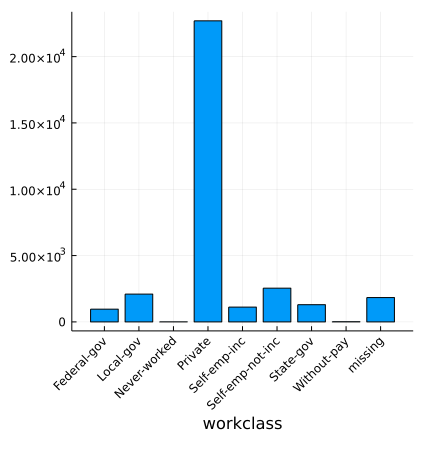

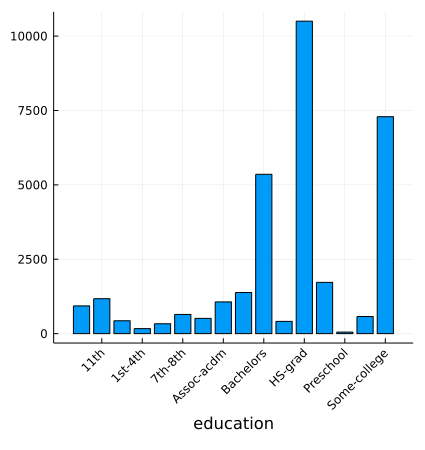

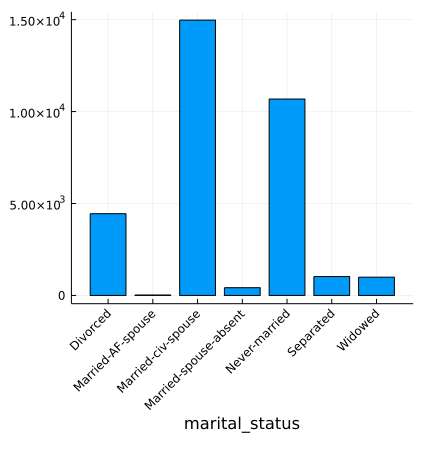

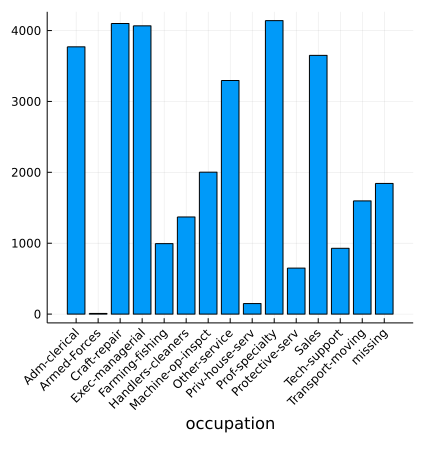

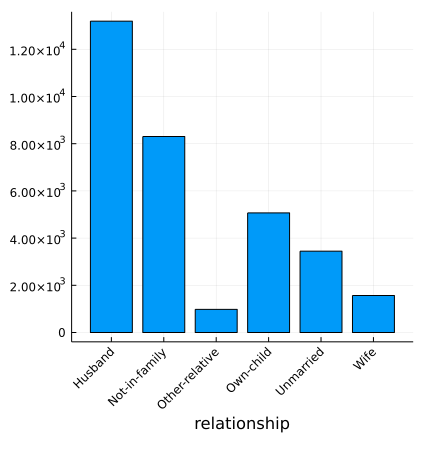

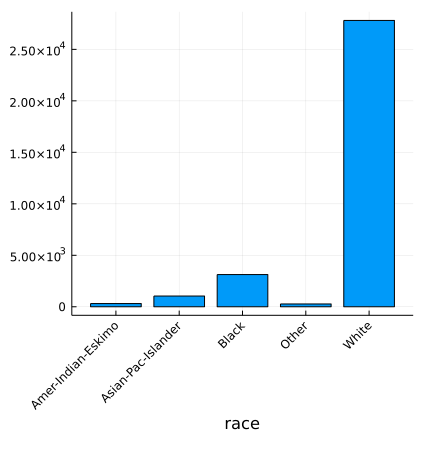

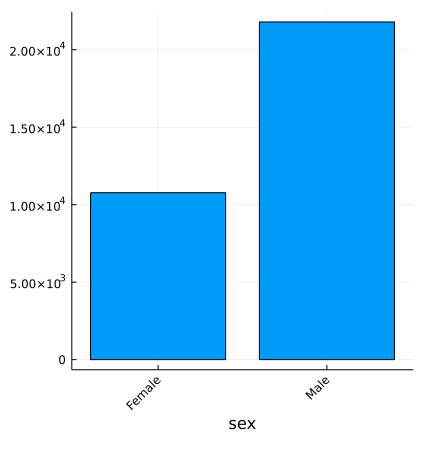

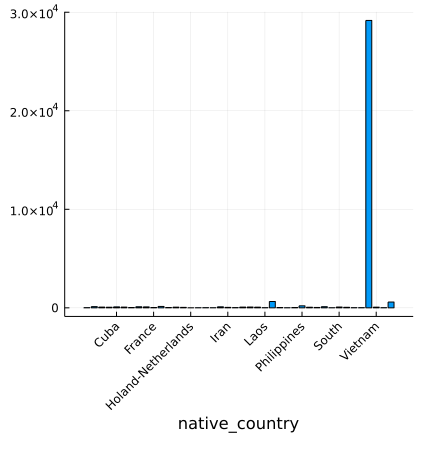

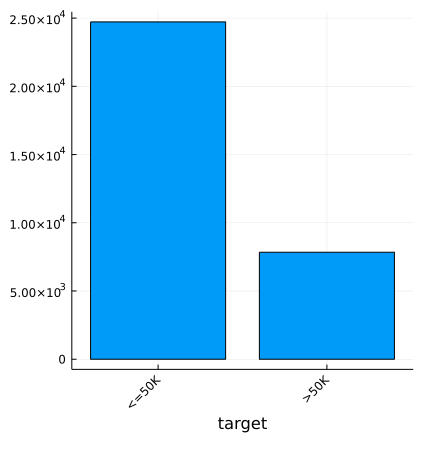

In [17]:
# Inspect distribution of nominal variables
foreach(display∘bar_helper, nominal)

In [18]:
# Inspect distribution of nominal variables
foreach(name -> println("\n", proptable(adult_train, name) |> sort), nominal)


9-element Named Vector{Float64}
workclass          │ 
───────────────────┼────────────
"Never-worked"     │ 0.000214981
"Without-pay"      │ 0.000429962
"Federal-gov"      │   0.0294831
"Self-emp-inc"     │   0.0342741
"State-gov"        │   0.0398636
missing            │   0.0563865
"Local-gov"        │   0.0642794
"Self-emp-not-inc" │   0.0780381
"Private"          │     0.69703

16-element Named Vector{Float64}
education      │ 
───────────────┼───────────
"Preschool"    │ 0.00156629
"1st-4th"      │ 0.00515955
"5th-6th"      │   0.010227
"Doctorate"    │  0.0126839
"12th"         │  0.0132981
"9th"          │  0.0157858
"Prof-school"  │  0.0176899
"7th-8th"      │  0.0198397
"10th"         │  0.0286539
"Assoc-acdm"   │  0.0327693
"11th"         │  0.0360861
"Assoc-voc"    │  0.0424434
"Masters"      │  0.0529161
"Bachelors"    │   0.164461
"Some-college" │   0.223918
"HS-grad"      │   0.322502

7-element Named Vector{Float64}
marital_status          │ 
────────────────────────┼──

In [19]:
# Collapse categories in 'native_country' column
#   replace missings with strings
replace!(adult_train.native_country, missing=>"placeholder")

#   overwrite the selected subset
adult_train.native_country[Not(adult_train.native_country .== "United-States")] .=
    "not-United-States";

In [20]:
# Check categories count after the operation
freqtable(adult_train.native_country)

2-element Named Vector{Int64}
Dim1                │ 
────────────────────┼──────
"United-States"     │ 29170
"not-United-States" │  3391

In [21]:
# Produce two-way table to learn more about relation between
# 'maritial_status' and 'relationship' features
@chain adult_train begin
    groupby([:marital_status, :relationship])
    combine(nrow)
    unstack(:marital_status, :relationship, :nrow)
end

,marital_status,Not-in-family,Own-child,Unmarried,Other-relative,Husband,Wife
,String31,Int64?,Int64?,Int64?,Int64?,Int64?,Int64?
1,Never-married,4706,4485,881,611,missing,missing
2,Married-civ-spouse,17,95,missing,124,13184,1556
3,Divorced,2404,328,1601,110,missing,missing
4,Married-spouse-absent,211,45,130,32,missing,missing
5,Separated,420,99,451,55,missing,missing
6,Married-AF-spouse,missing,1,missing,1,9,12
7,Widowed,547,15,383,48,missing,missing


In [22]:
# Extract continuous features
continuous = names(adult_train, Int)

5-element Vector{String}:
 "age"
 "education_num"
 "capital_gain"
 "capital_loss"
 "hours_per_week"

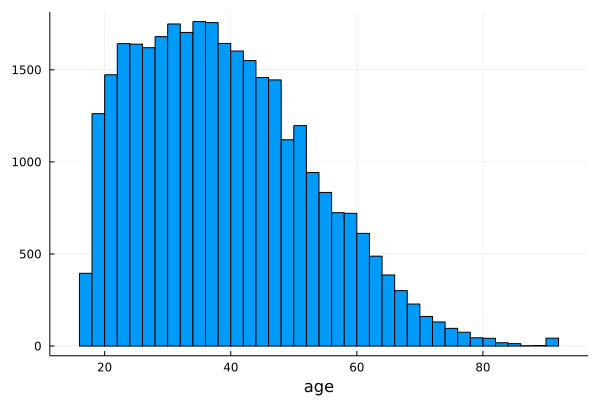

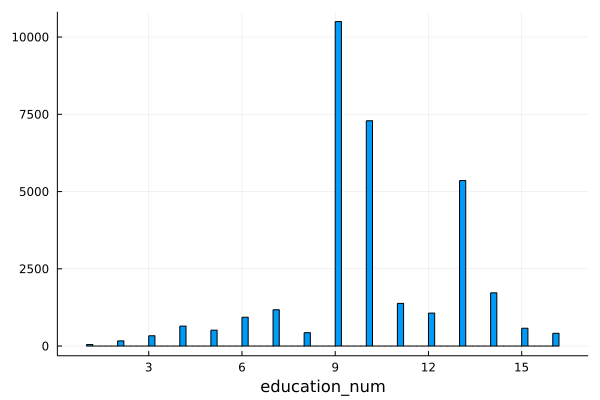

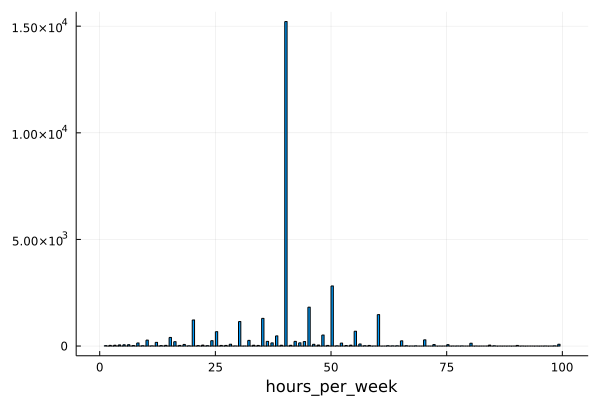

In [23]:
# Define a helper function for drawing of a single histogram
histogram_helper(column_name) =
    histogram(adult_train[!, column_name], xlabel=column_name, legend=false)

# Compose a grid of histograms in a single plot
foreach(x -> display(histogram_helper(x)), continuous)

In [24]:
# For the :capital_gain variable, calculate the probability of 0.
mean(adult_train.capital_gain .== 0)

0.9167101747489328

In [25]:
# For the :capital_loss variables, calculate the probability of 0.
mean(adult_train.capital_loss .== 0)

0.9533490986149074

In [26]:
# Check the same mean as above, but grouped by `target`
# It seems that wealthy people more often gain money on capital market, but also lose money more often (which seems reasonable)
@chain adult_train begin
    groupby(:target)
    combine([:capital_gain, :capital_loss] .=>
            (x -> mean(x .== 0)) .=>
            [:freq0_capital_gain, :freq0_capital_loss])
end

,target,freq0_capital_gain,freq0_capital_loss
,String7,Float64,Float64
1,<=50K,0.958131,0.969822
2,>50K,0.786124,0.901416


In [27]:
# Save clean dataset as Arrow file
Arrow.write("adult_train.arrow", adult_train)

"adult_train.arrow"